This file combines taxi_trajectory_eda, taxi_demand, taxi_next_location 
Some portions of this code were generated with ChatGPT (OpenAI, 2023) and are attributed inline where they appear

References:
OpenAI. (2023). ChatGPT (Mar 14 version) [Large language model]. https://chat.openai.com/chat

- Load the dataset into a Pandas DataFrame.
- Display the first few rows.
- Get an overview of the dataset (columns, data types, missing values, etc.).

In [40]:
import pandas as pd
import ast
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
# Load the dataset
file_path = 'taxi_trajectories/train.csv'  
df = pd.read_csv(file_path)

df.head()

,Unnamed: 0,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[..."
1,1,1372637303620000596,B,NaN,7.0,20000596,1372637303,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[..."
2,2,1372636951620000320,C,NaN,NaN,20000320,1372636951,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-..."
3,3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[..."
4,4,1372637091620000337,C,NaN,NaN,20000337,1372637091,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-..."


In [10]:
# filter missing data
df = df[df['MISSING_DATA'] == False]

df.shape

(1710660, 10)

In [11]:

# Get basic info about the dataset
print("\nDataset Info:")
df.info()



Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 1710660 entries, 0 to 1710669
Data columns (total 10 columns):
 #   Column        Dtype  
---  ------        -----  
 0   Unnamed: 0    int64  
 1   TRIP_ID       int64  
 2   CALL_TYPE     object 
 3   ORIGIN_CALL   float64
 4   ORIGIN_STAND  float64
 5   TAXI_ID       int64  
 6   TIMESTAMP     int64  
 7   DAY_TYPE      object 
 8   MISSING_DATA  bool   
 9   POLYLINE      object 
dtypes: bool(1), float64(2), int64(4), object(3)
memory usage: 132.1+ MB


In [12]:
# Polyline cleanup

# Convert POLYLINE from string to list
df['POLYLINE'] = df['POLYLINE'].apply(ast.literal_eval)

# POLYLINE should contain at least two GPS points for valid trajectories.
# Filter rows with less than 2 GPS points
df = df[df['POLYLINE'].apply(len) > 1]

In [14]:
# Check for other missing values
print("\nMissing Values:")
df.isnull().sum()


Missing Values:


Unnamed: 0            0
TRIP_ID               0
CALL_TYPE             0
ORIGIN_CALL     1311436
ORIGIN_STAND     876466
TAXI_ID               0
TIMESTAMP             0
DAY_TYPE              0
MISSING_DATA          0
POLYLINE              0
dtype: int64

- Drop `Unnamed: 0` (unnecessary index columns).  
- `ORIGIN_CALL` and `ORIGIN_STAND` have significant missing values but thats fine as they not used for our model predictions
- `POLYLINE` is an object but contains lists (keep as is).  
- Convert `TIMESTAMP` to datetime for better analysis.  


In [16]:
# Drop unnecessary index columns
df.drop(columns=['Unnamed: 0'], inplace=True)

# Convert TIMESTAMP to datetime format
df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'], unit='s')

# Display the updated dataset info
print("\nUpdated Dataset Info:")
df.info()


Updated Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 1674152 entries, 0 to 1710669
Data columns (total 9 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   TRIP_ID       1674152 non-null  int64         
 1   CALL_TYPE     1674152 non-null  object        
 2   ORIGIN_CALL   362716 non-null   float64       
 3   ORIGIN_STAND  797686 non-null   float64       
 4   TAXI_ID       1674152 non-null  int64         
 5   TIMESTAMP     1674152 non-null  datetime64[ns]
 6   DAY_TYPE      1674152 non-null  object        
 7   MISSING_DATA  1674152 non-null  bool          
 8   POLYLINE      1674152 non-null  object        
dtypes: bool(1), datetime64[ns](1), float64(2), int64(2), object(3)
memory usage: 116.6+ MB


In [17]:
# Display first few rows after modifications
print("\nUpdated Dataset Preview:")
df.head()



Updated Dataset Preview:


,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1372636858620000589,C,NaN,NaN,20000589,2013-07-01 00:00:58,A,False,"[[-8.618643, 41.141412], [-8.618499, 41.141376..."
1,1372637303620000596,B,NaN,7.0,20000596,2013-07-01 00:08:23,A,False,"[[-8.639847, 41.159826], [-8.640351, 41.159871..."
2,1372636951620000320,C,NaN,NaN,20000320,2013-07-01 00:02:31,A,False,"[[-8.612964, 41.140359], [-8.613378, 41.14035]..."
3,1372636854620000520,C,NaN,NaN,20000520,2013-07-01 00:00:54,A,False,"[[-8.574678, 41.151951], [-8.574705, 41.151942..."
4,1372637091620000337,C,NaN,NaN,20000337,2013-07-01 00:04:51,A,False,"[[-8.645994, 41.18049], [-8.645949, 41.180517]..."


- `ORIGIN_CALL` (~78% missing) -> Drop it.  
- `ORIGIN_STAND` (~52% missing) -> Fill NaNs with `0` (assuming it means no stand).  



In [18]:
# Drop ORIGIN_CALL column due to excessive missing values
df.drop(columns=['ORIGIN_CALL'], inplace=True)

# Fill ORIGIN_STAND NaN values with 0
df['ORIGIN_STAND'].fillna(0, inplace=True)

# Verify changes
print("\nUpdated Missing Values Count:")
df.isnull().sum()




/var/folders/mv/1l8hsgqn1gg1ysw_5rvfsz7c0000gp/T/ipykernel_99446/1700559561.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['ORIGIN_STAND'].fillna(0, inplace=True)



Updated Missing Values Count:


TRIP_ID         0
CALL_TYPE       0
ORIGIN_STAND    0
TAXI_ID         0
TIMESTAMP       0
DAY_TYPE        0
MISSING_DATA    0
POLYLINE        0
dtype: int64

In [19]:
# Display dataset info after modifications
print("\nDataset Info After Handling Missing Values:")
df.info()


Dataset Info After Handling Missing Values:
<class 'pandas.core.frame.DataFrame'>
Index: 1674152 entries, 0 to 1710669
Data columns (total 8 columns):
 #   Column        Non-Null Count    Dtype         
---  ------        --------------    -----         
 0   TRIP_ID       1674152 non-null  int64         
 1   CALL_TYPE     1674152 non-null  object        
 2   ORIGIN_STAND  1674152 non-null  float64       
 3   TAXI_ID       1674152 non-null  int64         
 4   TIMESTAMP     1674152 non-null  datetime64[ns]
 5   DAY_TYPE      1674152 non-null  object        
 6   MISSING_DATA  1674152 non-null  bool          
 7   POLYLINE      1674152 non-null  object        
dtypes: bool(1), datetime64[ns](1), float64(1), int64(2), object(3)
memory usage: 103.8+ MB


In [20]:
# Display first few rows to confirm changes
print("\nUpdated Dataset Preview:")
df.head()


Updated Dataset Preview:


,TRIP_ID,CALL_TYPE,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1372636858620000589,C,0.0,20000589,2013-07-01 00:00:58,A,False,"[[-8.618643, 41.141412], [-8.618499, 41.141376..."
1,1372637303620000596,B,7.0,20000596,2013-07-01 00:08:23,A,False,"[[-8.639847, 41.159826], [-8.640351, 41.159871..."
2,1372636951620000320,C,0.0,20000320,2013-07-01 00:02:31,A,False,"[[-8.612964, 41.140359], [-8.613378, 41.14035]..."
3,1372636854620000520,C,0.0,20000520,2013-07-01 00:00:54,A,False,"[[-8.574678, 41.151951], [-8.574705, 41.151942..."
4,1372637091620000337,C,0.0,20000337,2013-07-01 00:04:51,A,False,"[[-8.645994, 41.18049], [-8.645949, 41.180517]..."


- Extract `hour`, `day of the week`, and `month` from `TIMESTAMP` for trend analysis.  
- Plot trip frequency by hour to identify peak demand times.  


/var/folders/mv/1l8hsgqn1gg1ysw_5rvfsz7c0000gp/T/ipykernel_99446/4199309074.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=hourly_trips.index, y=hourly_trips.values, palette="viridis")


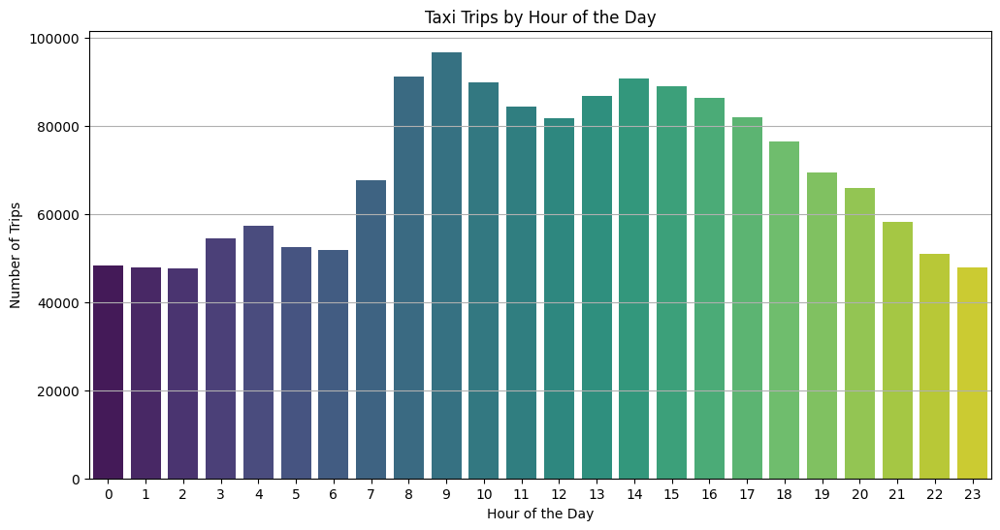

In [22]:
# Extract date-related features
df['HOUR'] = df['TIMESTAMP'].dt.hour
df['DAY_OF_WEEK'] = df['TIMESTAMP'].dt.dayofweek  # Monday = 0, Sunday = 6
df['MONTH'] = df['TIMESTAMP'].dt.month

# Count trips per hour
hourly_trips = df['HOUR'].value_counts().sort_index()

# Plot trip frequency by hour
plt.figure(figsize=(12, 6))
sns.barplot(x=hourly_trips.index, y=hourly_trips.values, palette="viridis")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Trips")
plt.title("Taxi Trips by Hour of the Day")
plt.xticks(range(0, 24))
plt.grid(axis='y')
plt.show()


- **Morning & Evening Peaks:**  
  - Surge in trips from **8-10 AM** (morning commute).  
  - Another peak from **4-6 PM** (evening rush).  

- **Nighttime Drop:**  
  - Significant decline after **9 PM**, staying low until early morning.  

- **Steady Midday Usage:**  
  - Consistent trip volume between **10 AM - 4 PM**.  

- Next: Analyze trip patterns across weekdays vs. weekends.  

C:\Users\Mohammad\AppData\Local\Temp\ipykernel_6192\1093820536.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=day_labels, y=day_of_week_trips.values, palette="viridis")


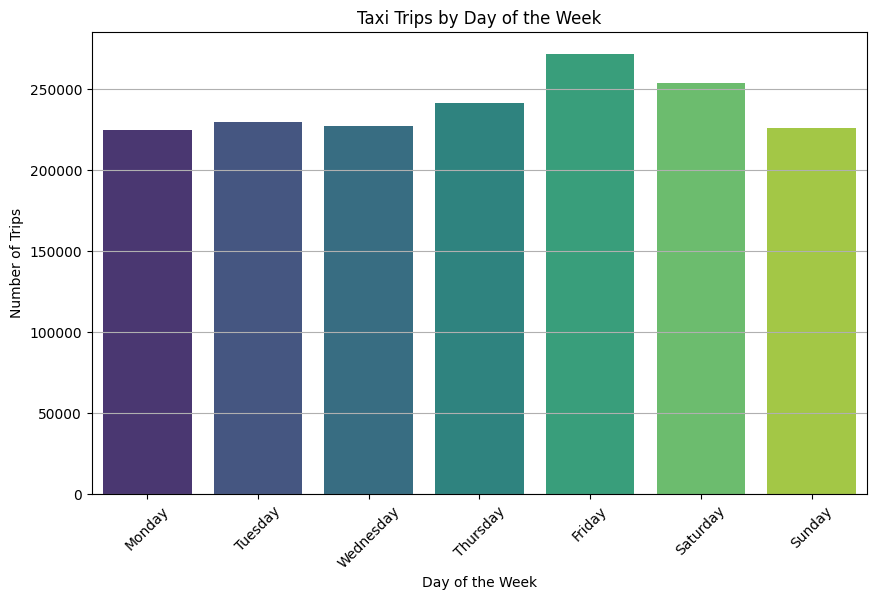

In [52]:
# Count trips by day of the week
day_of_week_trips = df['DAY_OF_WEEK'].value_counts().sort_index()

# Day mapping for better labels
day_mapping = {0: 'Monday', 1: 'Tuesday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
day_labels = [day_mapping[day] for day in day_of_week_trips.index]

# Plot trip frequency by day of the week
plt.figure(figsize=(10, 6))
sns.barplot(x=day_labels, y=day_of_week_trips.values, palette="viridis")
plt.xlabel("Day of the Week")
plt.ylabel("Number of Trips")
plt.title("Taxi Trips by Day of the Week")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


- Friday and Saturday have the highest demand, likely due to nightlife and weekend activities.  
- Monday to Thursday show steady trip volumes, typical of workweek commutes.  
- Sunday sees a slight drop, may be a rest day for many people, or possibly due to reduced travel demand.  

Next:
- Compute, analyze and plot a histogram of `TRAJECTORY_LENGTH` (number of GPS points in a trip) to observe its distribution.  
- Identify potential outliers or unusual trends.  



In [23]:
# Compute trajectory lengths
df['TRAJECTORY_LENGTH'] = df['POLYLINE'].apply(len)


In [24]:
# Compute basic statistics
average_length = df['TRAJECTORY_LENGTH'].mean()
max_length = df['TRAJECTORY_LENGTH'].max()
min_length = df['TRAJECTORY_LENGTH'].min()
median_length = df['TRAJECTORY_LENGTH'].median()

print(f"Average Trajectory Length: {average_length}")
print(f"Maximum Trajectory Length: {max_length}")
print(f"Minimum Trajectory Length: {min_length}")
print(f"Median Trajectory Length: {median_length}")

Average Trajectory Length: 49.80301071826214
Maximum Trajectory Length: 3881
Minimum Trajectory Length: 2
Median Trajectory Length: 42.0


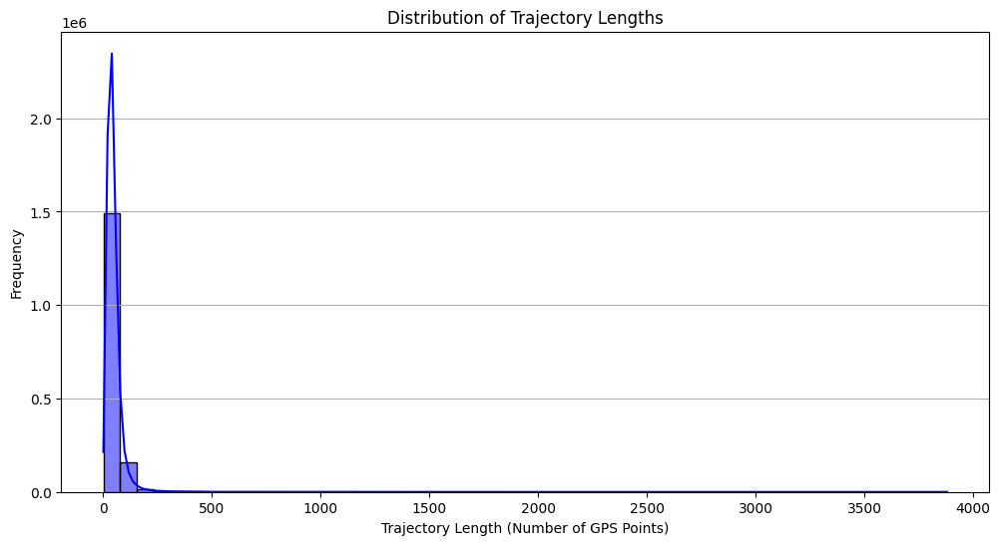

In [25]:
# Plot the distribution of TRAJECTORY_LENGTH
plt.figure(figsize=(12, 6))
sns.histplot(df['TRAJECTORY_LENGTH'], bins=50, kde=True, color="blue")
plt.xlabel("Trajectory Length (Number of GPS Points)")
plt.ylabel("Frequency")
plt.title("Distribution of Trajectory Lengths")
plt.grid(axis='y')
plt.show()


- Most trips are short, with a high frequency under **100 GPS points**.  
- A long tail exists, indicating some long-distance trips.  
- Potential outliers: trips above **300 GPS points** may be long-distance or erroneous.  
- Typical trip lengths fall between **20-100 GPS points**.  


Next:
- Get summary stats for `TRAJECTORY_LENGTH` to see typical trip lengths.  
- Use the IQR method to spot and summarize any unusually long trips.  


In [30]:
# Compute descriptive statistics
trajectory_stats = df['TRAJECTORY_LENGTH'].describe()
print("\nTrajectory Length Statistics:")
print(trajectory_stats)

# Define IQR for outlier detection
Q1 = trajectory_stats['25%']
Q3 = trajectory_stats['75%']
IQR = Q3 - Q1

# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

print(f"\nOutlier Thresholds: Lower = {lower_bound}, Upper = {upper_bound}")

# Count outliers
outliers = df[(df['TRAJECTORY_LENGTH'] < lower_bound) | (df['TRAJECTORY_LENGTH'] > upper_bound)]
print(f"\nNumber of Outliers: {len(outliers)}")

# Display sample of outliers
print("\nSample Outliers:")
outliers.head()



Trajectory Length Statistics:
count    1.674152e+06
mean     4.980301e+01
std      4.558953e+01
min      2.000000e+00
25%      2.900000e+01
50%      4.200000e+01
75%      5.900000e+01
max      3.881000e+03
Name: TRAJECTORY_LENGTH, dtype: float64

Outlier Thresholds: Lower = -16.0, Upper = 104.0

Number of Outliers: 81116

Sample Outliers:


,TRIP_ID,CALL_TYPE,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,HOUR,DAY_OF_WEEK,MONTH,TRAJECTORY_LENGTH
45,1372639536620000570,A,0.0,20000570,2013-07-01 00:45:36,A,False,"[[-8.663409, 41.180724], [-8.665209, 41.18112]...",0,0,7,145
73,1372638303620000112,A,0.0,20000112,2013-07-01 00:25:03,A,False,"[[-8.587116, 41.162427], [-8.586198, 41.162112...",0,0,7,116
86,1372637754620000007,C,0.0,20000007,2013-07-01 00:15:54,A,False,"[[-8.645373, 41.008275], [-8.645427, 41.00886]...",0,0,7,105
93,1372644253620000574,C,0.0,20000574,2013-07-01 02:04:13,A,False,"[[-8.640792, 41.149026], [-8.640126, 41.146227...",2,0,7,141
102,1372638616620000672,C,0.0,20000672,2013-07-01 00:30:16,A,False,"[[-8.67411, 41.153868], [-8.674119, 41.153841]...",0,0,7,112


- **Outlier Thresholds:** Anything above **104 GPS points** is an outlier (no lower outliers).  
- **Outlier Count:** **81116** (~4.84% of the data) exceed this threshold.  
- **Nature of Outliers:** These are extra-long trips, but some might be data errors.  

We have two options:
- **Option 1: Cap Lengths** -> Keep all data but limit extreme values.  
- **Option 2: Remove Outliers** -> Get a cleaner dataset, reducing noise.  

Went with: Remove Outliers  
- **Better Model Accuracy:** Prevents extreme trips from skewing predictions.  
- **Cleaner Data:** Focuses on typical taxi trips, improving reliability.  
- **Easier Analysis:** Makes trends clearer and models simpler to train.  

Next Steps  
- Drop all trips where `TRAJECTORY_LENGTH` is over **104 GPS points**.  



In [33]:
# Remove outliers
cleaned_df = df[df['TRAJECTORY_LENGTH'] <= 104]

# Check the shape of the dataset after removal
print(f"Original Dataset Size: {df.shape[0]}")
print(f"Cleaned Dataset Size: {cleaned_df.shape[0]}")
print(f"Number of Rows Removed: {df.shape[0] - cleaned_df.shape[0]}")

# Display descriptive statistics of TRAJECTORY_LENGTH after removal
print("\nTrajectory Length Statistics (After Outlier Removal):")
print(cleaned_df['TRAJECTORY_LENGTH'].describe())


Original Dataset Size: 1674152
Cleaned Dataset Size: 1593036
Number of Rows Removed: 81116

Trajectory Length Statistics (After Outlier Removal):
count    1.593036e+06
mean     4.348283e+01
std      2.060735e+01
min      2.000000e+00
25%      2.800000e+01
50%      4.100000e+01
75%      5.600000e+01
max      1.040000e+02
Name: TRAJECTORY_LENGTH, dtype: float64


- **Dataset Reduction:** Now **1,593,036 rows**.  
- **Updated Stats:**  
  - Mean trajectory length: **43.48 GPS points** (was 48.88).  
  - Standard deviation: **20.61** (less spread out).  
  - Max length: **104 GPS points** (the set cap).  



- Convert `CALL_TYPE` and `DAY_TYPE` into numbers for modeling.  
 


In [34]:
cleaned_df = cleaned_df.copy()

# Encode categorical variables
cleaned_df['CALL_TYPE'] = cleaned_df['CALL_TYPE'].astype('category').cat.codes
cleaned_df['DAY_TYPE'] = cleaned_df['DAY_TYPE'].astype('category').cat.codes


# Display the prepared dataset info
print("\nPrepared Dataset Info:")
print(cleaned_df.info())

# Display a sample of the prepared dataset
print("\nSample Rows:")
cleaned_df.head()



Prepared Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 1593036 entries, 0 to 1710669
Data columns (total 12 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   TRIP_ID            1593036 non-null  int64         
 1   CALL_TYPE          1593036 non-null  int8          
 2   ORIGIN_STAND       1593036 non-null  float64       
 3   TAXI_ID            1593036 non-null  int64         
 4   TIMESTAMP          1593036 non-null  datetime64[ns]
 5   DAY_TYPE           1593036 non-null  int8          
 6   MISSING_DATA       1593036 non-null  bool          
 7   POLYLINE           1593036 non-null  object        
 8   HOUR               1593036 non-null  int32         
 9   DAY_OF_WEEK        1593036 non-null  int32         
 10  MONTH              1593036 non-null  int32         
 11  TRAJECTORY_LENGTH  1593036 non-null  int64         
dtypes: bool(1), datetime64[ns](1), float64(1), int32(3), int64(3), in

,TRIP_ID,CALL_TYPE,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,HOUR,DAY_OF_WEEK,MONTH,TRAJECTORY_LENGTH
0,1372636858620000589,2,0.0,20000589,2013-07-01 00:00:58,0,False,"[[-8.618643, 41.141412], [-8.618499, 41.141376...",0,0,7,23
1,1372637303620000596,1,7.0,20000596,2013-07-01 00:08:23,0,False,"[[-8.639847, 41.159826], [-8.640351, 41.159871...",0,0,7,19
2,1372636951620000320,2,0.0,20000320,2013-07-01 00:02:31,0,False,"[[-8.612964, 41.140359], [-8.613378, 41.14035]...",0,0,7,65
3,1372636854620000520,2,0.0,20000520,2013-07-01 00:00:54,0,False,"[[-8.574678, 41.151951], [-8.574705, 41.151942...",0,0,7,43
4,1372637091620000337,2,0.0,20000337,2013-07-01 00:04:51,0,False,"[[-8.645994, 41.18049], [-8.645949, 41.180517]...",0,0,7,29


In [35]:
# Encode DAY_OF_WEEK into numeric values
day_mapping = {'Monday': 0, 'Tuesday': 1, 'Wednesday': 2, 'Thursday': 3, 
               'Friday': 4, 'Saturday': 5, 'Sunday': 6}
cleaned_df['DAY_OF_WEEK'] = cleaned_df['DAY_OF_WEEK'].map(day_mapping)

# drop MISSING_Data 
model_df = cleaned_df.drop(columns=['MISSING_DATA'])

# Display updated dataset info
print("\nUpdated Dataset Info:")
print(model_df.info())

# Display a sample of the finalized dataset
print("\nSample Rows:")
model_df.head()



Updated Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 1593036 entries, 0 to 1710669
Data columns (total 11 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   TRIP_ID            1593036 non-null  int64         
 1   CALL_TYPE          1593036 non-null  int8          
 2   ORIGIN_STAND       1593036 non-null  float64       
 3   TAXI_ID            1593036 non-null  int64         
 4   TIMESTAMP          1593036 non-null  datetime64[ns]
 5   DAY_TYPE           1593036 non-null  int8          
 6   POLYLINE           1593036 non-null  object        
 7   HOUR               1593036 non-null  int32         
 8   DAY_OF_WEEK        0 non-null        float64       
 9   MONTH              1593036 non-null  int32         
 10  TRAJECTORY_LENGTH  1593036 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int32(2), int64(3), int8(2), object(1)
memory usage: 112.4+ MB
None

Sample Rows:


,TRIP_ID,CALL_TYPE,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,POLYLINE,HOUR,DAY_OF_WEEK,MONTH,TRAJECTORY_LENGTH
0,1372636858620000589,2,0.0,20000589,2013-07-01 00:00:58,0,"[[-8.618643, 41.141412], [-8.618499, 41.141376...",0,NaN,7,23
1,1372637303620000596,1,7.0,20000596,2013-07-01 00:08:23,0,"[[-8.639847, 41.159826], [-8.640351, 41.159871...",0,NaN,7,19
2,1372636951620000320,2,0.0,20000320,2013-07-01 00:02:31,0,"[[-8.612964, 41.140359], [-8.613378, 41.14035]...",0,NaN,7,65
3,1372636854620000520,2,0.0,20000520,2013-07-01 00:00:54,0,"[[-8.574678, 41.151951], [-8.574705, 41.151942...",0,NaN,7,43
4,1372637091620000337,2,0.0,20000337,2013-07-01 00:04:51,0,"[[-8.645994, 41.18049], [-8.645949, 41.180517]...",0,NaN,7,29


In [37]:
# Save the original cleaned dataset to a CSV file
model_df.to_csv('taxi_trajectories/cleaned_taxi_data.csv', index=False)

# Confirm the file was saved
print("\nCleaned dataset saved as 'cleaned_taxi_data.csv'.")



Cleaned dataset saved as 'cleaned_taxi_data.csv'.


In [426]:
# This file implements a LTSM model to predict taxi demand for a given zone and time in Porto
# Some portions of this code were generated with ChatGPT (OpenAI, 2023) and are attributed inline where they appear

# References:
# OpenAI. (2023). ChatGPT (Mar 14 version) [Large language model]. https://chat.openai.com/chat

In [486]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
import ast
from sklearn.metrics import mean_absolute_error, mean_squared_error
import joblib

In [459]:
# Load dataset
df = pd.read_csv("taxi_trajectories/cleaned_taxi_data.csv") 


In [460]:
# Only sample 600000 rows
df = df.sample(n=600000, random_state=1234)

In [461]:
df.head()

,TRIP_ID,CALL_TYPE,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,POLYLINE,HOUR,DAY_OF_WEEK,MONTH,TRAJECTORY_LENGTH
1335278,1399476189620000031,0,0.0,20000031,2014-05-07 15:23:09,0,"[[-8.631648, 41.15889], [-8.63181, 41.159079],...",15,NaN,5,49
568182,1383824959620000018,0,0.0,20000018,2013-11-07 11:49:19,0,"[[-8.610075, 41.152941], [-8.609967, 41.152824...",11,NaN,11,45
93529,1374414533620000393,1,15.0,20000393,2013-07-21 13:48:53,0,"[[-8.585586, 41.14845], [-8.585811, 41.148792]...",13,NaN,7,44
1266195,1398243456620000343,1,21.0,20000343,2014-04-23 08:57:36,0,"[[-8.628759, 41.160987], [-8.628678, 41.160942...",8,NaN,4,37
1334937,1399477781620000160,1,15.0,20000160,2014-05-07 15:49:41,0,"[[-8.585667, 41.148477], [-8.585658, 41.148495...",15,NaN,5,63


In [487]:
# This function was generated with help of ChatGPT (OpenAI, 2023) 
def create_zones(df, n_clusters=10):
    # Convert POLYLINE string to list of coordinates and get the first point (pickup location)
    def extract_first_point(polyline_str):
        try:
            coords = ast.literal_eval(polyline_str)  # Convert string to list
            return coords[0] if coords else [np.nan, np.nan]  # Handle empty lists
        except:
            return [np.nan, np.nan]  # Handle invalid formats
    
    # Extract pickup coordinates and keep original index
    pickup_coords = df['POLYLINE'].apply(extract_first_point)
    pickup_df = pd.DataFrame(pickup_coords.tolist(), columns=['pickup_lon', 'pickup_lat'], index=df.index)  # Retain df's original index
    print(pickup_df.head())

    # Remove coordinates outside Porto 
    def remove_non_porto(df):
        return df[(df['pickup_lat'] >= 41.0) & (df['pickup_lat'] <= 41.3) & (df['pickup_lon'] >= -8.7) & (df['pickup_lon'] <= -8.5)]
    
    # Remove rows with invalid or out-of-bound coordinates
    pickup_df = remove_non_porto(pickup_df)

    # Identify valid rows (before dropping NaN)
    valid_indices = pickup_df.dropna().index

    # Remove invalid coordinates (drop NaN values)
    valid_coords = pickup_df.dropna()

    # Ensure there is enough data to perform clustering
    if len(valid_coords) < n_clusters:
        raise ValueError("Not enough valid pickup points for clustering!")

    # Perform K-means clustering on the valid coordinates
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=n_clusters)
    clusters = kmeans.fit(valid_coords)

    # Initialize 'zone' column with -1 (indicating unassigned zone)
    df['zone'] = -1
    df['pickup_coords'] = pickup_coords  # Store the original pickup coordinates in the dataframe

    # Assign cluster labels to the valid indices in the original dataframe
    df.loc[valid_indices, 'zone'] = clusters.labels_

    # Remove rows with zone == -1 (unassigned)
    df = df[df['zone'] != -1]

    df = df.reset_index(drop=True)

    joblib.dump(kmeans, "taxi_trajectories/zone.pkl")

    return df, kmeans

In [463]:
# This function was generated with help of ChatGPT (OpenAI, 2023) 
def group_data_by_zone_and_datetime(df):
    # Group by datetime hour and zone to get demand count
    hourly_zone_demand = df.groupby([
        pd.Grouper(key='TIMESTAMP', freq='H'),
        'zone'
    ]).size().reset_index()
    hourly_zone_demand.columns = ['TIMESTAMP', 'zone', 'demand']
    
    # Pivot table to get demand for each zone in columns
    demand_matrix = hourly_zone_demand.pivot(
        index='TIMESTAMP',
        columns='zone',
        values='demand'
    ).fillna(0)

    # Ensure the index is sorted for time series consistency
    demand_matrix = demand_matrix.sort_index()
    
    return demand_matrix

In [464]:
# this function generated via chat gpt
def create_sequences(data, seq_length):
    sequences = []
    targets = []
    
    for i in range(len(data) - seq_length):
        sequences.append(data[i:(i + seq_length)])
        targets.append(data[i + seq_length])
    
    return np.array(sequences), np.array(targets)

In [465]:
def build_lstm_model(seq_length, n_zones, num_lags):
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(256, input_shape=(seq_length, n_zones * (num_lags + 1) + 1), return_sequences=True),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.LSTM(128, return_sequences=True),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.LSTM(64),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dense(n_zones, activation='relu')
    ])
    
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

In [488]:
n_clusters=5
seq_length=24
test_size=0.2
epochs=50


# Create zones
df_with_zones, kmeans = create_zones(df, n_clusters)
    

         pickup_lon  pickup_lat
1335278   -8.631648   41.158890
568182    -8.610075   41.152941
93529     -8.585586   41.148450
1266195   -8.628759   41.160987
1334937   -8.585667   41.148477


In [467]:
# Group data by zone and datetime
df_with_zones['TIMESTAMP'] = pd.to_datetime(df_with_zones['TIMESTAMP'])
demand_matrix = group_data_by_zone_and_datetime(df_with_zones)
# Extract day of week and hour
demand_matrix['day_of_week'] = demand_matrix.index.dayofweek  # Monday=0, Sunday=6
demand_matrix['hour'] = demand_matrix.index.hour

# Create the bar_traffic flag (1 for Fri & Sat 2AM-4AM, else 0)
demand_matrix['bar_traffic'] = ((demand_matrix['day_of_week'].isin([4, 5])) &  # Friday (4) & Saturday (5)
                                (demand_matrix['hour'].between(2, 4))).astype(int)

# drop day of week and hour
demand_matrix = demand_matrix.drop(['day_of_week', 'hour'], axis=1)

print(demand_matrix.shape)
print(demand_matrix.head())

/var/folders/mv/1l8hsgqn1gg1ysw_5rvfsz7c0000gp/T/ipykernel_31373/2417362806.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  pd.Grouper(key='TIMESTAMP', freq='H'),


(8760, 6)
zone                    0    1    2    3    4  bar_traffic
TIMESTAMP                                                 
2013-07-01 00:00:00  19.0  2.0  3.0  2.0  8.0            0
2013-07-01 01:00:00  15.0  1.0  2.0  0.0  1.0            0
2013-07-01 02:00:00  13.0  2.0  2.0  2.0  5.0            0
2013-07-01 03:00:00  15.0  4.0  1.0  5.0  5.0            0
2013-07-01 04:00:00  13.0  3.0  2.0  5.0  6.0            0


   zone  pickup_lat  pickup_lon
0     0   -8.611212   41.148175
1     1   -8.667951   41.163851
2     2   -8.583358   41.154858
3     3   -8.599291   41.177272
4     4   -8.635240   41.160782


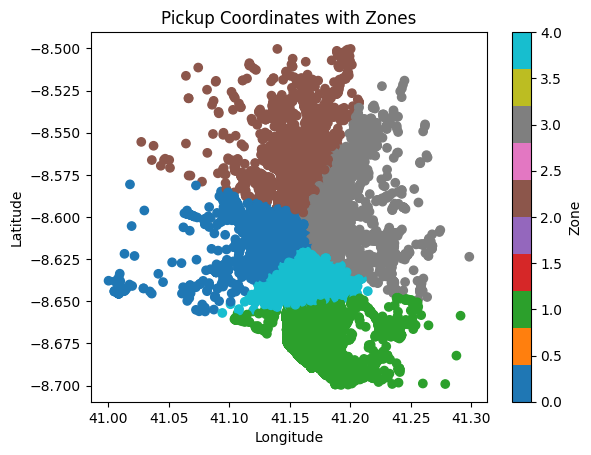

In [474]:
# Group by 'zone' to see the coordinates for each zone
df_with_zones[['pickup_lat', 'pickup_lon']] = pd.DataFrame(df_with_zones['pickup_coords'].tolist(), index=df_with_zones.index)
df_with_zones.head()

zone_coords = df_with_zones.groupby('zone').agg({'pickup_lat': 'mean', 'pickup_lon': 'mean'}).reset_index()

print(zone_coords)

import matplotlib.pyplot as plt

plt.scatter(df_with_zones['pickup_lon'], df_with_zones['pickup_lat'], c=df_with_zones['zone'], cmap='tab10')
plt.title("Pickup Coordinates with Zones")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.colorbar(label="Zone")
plt.show()

In [469]:
def add_lag_features(df, lags=[1, 2, 3]):
    """
    Adds lag features for demand prediction.
    
    Parameters:
    df (pd.DataFrame): Dataframe with 'TIMESTAMP' as index and demand columns per zone.
    lags (list): List of lag values (e.g., [1, 2, 3] for 1-hour, 2-hour, 3-hour lag)
    
    Returns:
    pd.DataFrame: DataFrame with additional lagged demand columns.
    """
    df_lagged = df.copy()
    
    for lag in lags:
        df_lagged[[f'lag_{lag}_zone_{col}' for col in df.columns]] = df.shift(lag)
    
    return df_lagged.dropna()  # Drop NaNs caused by shifting

demand_matrix_with_lag = add_lag_features(demand_matrix, lags=[1, 2, 3])  # Add 1-hour, 2-hour, 3-hour lags

# remove the lag columns
demand_matrix_with_lag = demand_matrix_with_lag.drop(['lag_1_zone_bar_traffic', 'lag_2_zone_bar_traffic', 'lag_3_zone_bar_traffic'], axis=1)

demand_matrix_with_lag.columns = demand_matrix_with_lag.columns.astype(str)
scaler = MinMaxScaler()
scaled_demand_with_lag = scaler.fit_transform(demand_matrix_with_lag)
    
# Create sequences
X, y = create_sequences(scaled_demand_with_lag, seq_length)
# for y select only the zone columns and not the lag columns
y = y[:, :n_clusters]
print(X.shape, y.shape)

(8733, 24, 21) (8733, 5)


In [472]:
    
    # Split data
X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, shuffle=False
)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)


(6986, 24, 21) (6986, 5) (1747, 24, 21) (1747, 5)


In [473]:


# Build and train model
model = build_lstm_model(seq_length, n_clusters, num_lags=3)
    
history = model.fit(
    X_train, y_train,
    epochs=epochs,
    batch_size=32,
    validation_split=0.1,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True
        )
    ]
)
    

/Users/bosky/boskymsaiicoursework/src/module2-assginment/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0135 - mae: 0.0812 - val_loss: 0.0068 - val_mae: 0.0545
Epoch 2/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - loss: 0.0066 - mae: 0.0565 - val_loss: 0.0053 - val_mae: 0.0494
Epoch 3/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - loss: 0.0055 - mae: 0.0523 - val_loss: 0.0047 - val_mae: 0.0485
Epoch 4/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.0049 - mae: 0.0497 - val_loss: 0.0044 - val_mae: 0.0476
Epoch 5/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.0047 - mae: 0.0485 - val_loss: 0.0045 - val_mae: 0.0465
Epoch 6/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step - loss: 0.0044 - mae: 0.0466 - val_loss: 0.0040 - val_mae: 0.0442
Epoch 7/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step - loss: 0.0042 - mae: 0.0462 - val_loss: 0.0040 - val_mae: 0.0432
Epoch 8/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - loss: 0.0042 - mae: 0.0454 - val_loss: 0.0043 - val_mae: 0.0451
Epoch 9/50
197/197 ━━━━━━━━━━━━━━━━━━━━ 

55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


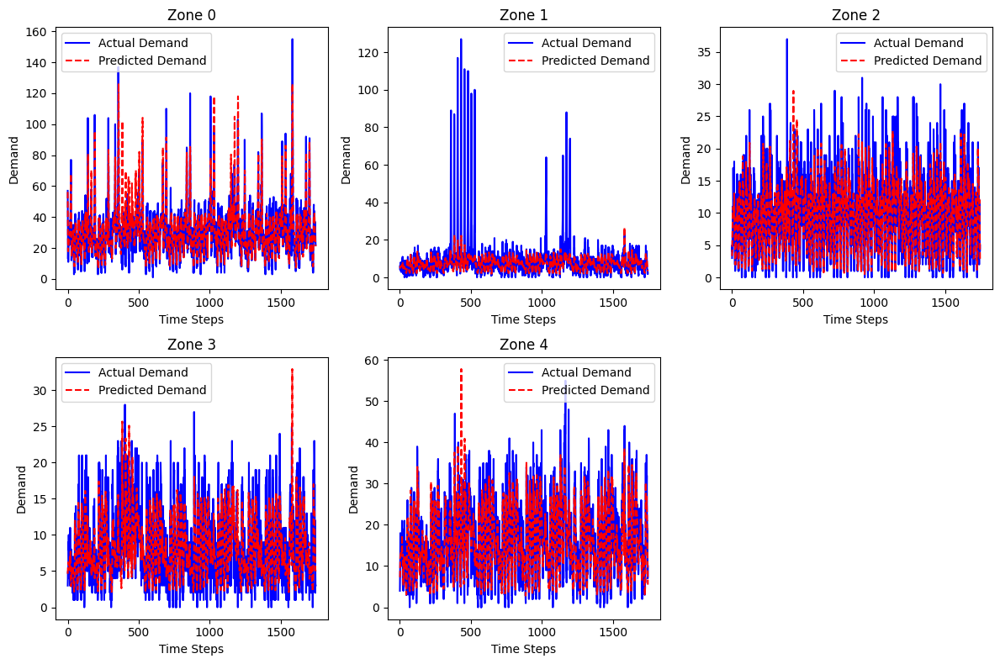

In [ ]:
# Make predictions on the test data
y_pred = model.predict(X_test)


y_test_actual = scaler.inverse_transform(np.pad(y_test, ((0,0), (0,16)), 'constant')[:, :21])
y_pred_actual = scaler.inverse_transform(np.pad(y_pred, ((0,0), (0,16)), 'constant')[:, :21])

# Create a figure with subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 8))  
axes[1, 2].axis("off") 

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Plot actual vs predicted for all zones
for zone_index in range(n_clusters):
    axes[zone_index].plot(y_test_actual[:, zone_index], label='Actual Demand', color='blue')
    axes[zone_index].plot(y_pred_actual[:, zone_index], label='Predicted Demand', color='red', linestyle='--')
    axes[zone_index].set_title(f'Zone {zone_index}')
    axes[zone_index].set_xlabel('Time Steps')
    axes[zone_index].set_ylabel('Demand')
    axes[zone_index].legend()

# Adjust the layout
plt.tight_layout()
plt.show()

In [482]:

mae_per_zone = [mean_absolute_error(y_test_actual[:, i], y_pred_actual[:, i]) for i in range(n_clusters)]
print("MAE per zone:", mae_per_zone)
mse_per_zone = [mean_squared_error(y_test_actual[:, i], y_pred_actual[:, i]) for i in range(n_clusters)]
print("MSE per zone:", mse_per_zone)
rmse_per_zone = [np.sqrt(mean_squared_error(y_test_actual[:, i], y_pred_actual[:, i])) for i in range(n_clusters)]
print("RMSE per zone:", rmse_per_zone)

# Prepare the data for better formatting
rmse_per_zone_rounded = [round(rmse, 3) for rmse in rmse_per_zone]

# Create a DataFrame to display the results neatly
metrics_df = pd.DataFrame({
    'Zone': [f'Zone {i}' for i in range(n_clusters)],
    'RMSE': rmse_per_zone_rounded
})

# Display the RMSE values in a clean format
print(metrics_df)

MAE per zone: [6.789593798403202, 4.082710533191221, 3.018270578497672, 2.605545858621734, 4.00079266043752]
MSE per zone: [111.9049831372064, 113.75649628136368, 16.211676110137446, 13.197536908490223, 32.05830930367074]
RMSE per zone: [np.float64(10.578515166941266), np.float64(10.665669049870415), np.float64(4.0263725746802725), np.float64(3.6328414372898554), np.float64(5.6620057668348185)]
     Zone    RMSE
0  Zone 0  10.579
1  Zone 1  10.666
2  Zone 2   4.026
3  Zone 3   3.633
4  Zone 4   5.662


In [456]:
print(y_test_actual.shape)
timestamps = demand_matrix_with_lag.index[-len(y_test_actual):] 

print(y_pred_actual.shape)
print(y_pred)

# Creating DataFrame for actual values
# only pick the first 5 zones
y_test_actual_5 = y_test_actual[:, :5]
y_pred_actual_5 = y_pred_actual[:, :5]
df_results = pd.DataFrame(y_test_actual_5, columns=[f"Actual_Zone_{i+1}" for i in range(y_test_actual_5.shape[1])])

# Adding predictions
for i in range(y_pred_actual_5.shape[1]):
    df_results[f"Predicted_Zone_{i+1}"] = y_pred_actual_5[:, i]

# Add timestamps
df_results.insert(0, "Timestamp", timestamps)


df_results.to_csv("taxi_trajectories/zone_actual_predictions.csv", index=False)

(1747, 21)
(1747, 21)
[[0.40378228 0.05314483 0.05638193 0.12258359 0.12407696]
 [0.23559597 0.04544944 0.0895144  0.13859324 0.13810828]
 [0.12749091 0.04362952 0.12110829 0.15433481 0.15913202]
 ...
 [0.1429161  0.03914907 0.12226051 0.14483537 0.14898752]
 [0.13502797 0.03550249 0.09484126 0.12799461 0.12048885]
 [0.11680861 0.03121824 0.0662733  0.12851214 0.0995415 ]]


This code is the LSTM prediction for next location that will demand taxi service.


In [3]:
# uncomment for google colab
#from google.colab import drive
#drive.mount('/content/drive')
#drive_path = '/content/drive/My Drive/'
drive_path = 'taxi_trajectories/'

In [6]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.model_selection import train_test_split
import ast
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

In [11]:
file_path =  drive_path + "cleaned_taxi_data.csv"
df = pd.read_csv(file_path)

#Convert TIMESTAMP to datetime
df['TIMESTAMP'] = pd.to_datetime(df['TIMESTAMP'])

#Extract time-based features
df['HOUR'] = df['TIMESTAMP'].dt.hour
df['DAY_OF_WEEK'] = df['TIMESTAMP'].dt.dayofweek
df['MONTH'] = df['TIMESTAMP'].dt.month

#Convert POLYLINE (GPS coordinates) from string to list
df['POLYLINE'] = df['POLYLINE'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

#Remove trips with no GPS data
df = df[df['POLYLINE'].apply(len) > 0]

#Normalize GPS coordinates
scaler = MinMaxScaler()
all_coords = np.vstack(df['POLYLINE'])
scaler.fit(all_coords)

#Function to create LSTM input sequences
def create_sequences_location(data, indices, seq_length=50):
    X, y, original_indices = [], [], []
    for idx, trip in zip(indices, data):
        trip = scaler.transform(trip)  # Normalize coordinates
        if len(trip) > seq_length:
            for i in range(len(trip) - seq_length):
                X.append(trip[i:i+seq_length])  # 50 GPS points as input
                y.append(trip[i+seq_length])    # Next coordinate as output
                original_indices.append(idx)   # Store the original DataFrame index
    return np.array(X), np.array(y), np.array(original_indices)

#Prepare LSTM dataset
X, y, seq_indices = create_sequences_location(df['POLYLINE'].values, indices=df.index, seq_length=50)

# Save preprocessed dataset (optional)
np.save(drive_path + "/X_sequences.npy", X)
np.save(drive_path + "/y_targets.npy", y)
np.save(drive_path + "/seq_indices.npy", seq_indices)

Here is the first iteration of the LSTM, with 200,000 random samples pulled from the nearly 2,000,000 rows of data. The processing needs were too great so as a team we decided on 200,000. The graphic below shows quick learning and reinforces that the LSTM was a good choice for this application.

Final X_train shape: (160000, 50, 2)
Final X_test shape: (40000, 50, 2)
Final y_train shape: (160000, 2)
Final y_test shape: (40000, 2)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 17s 10ms/step - loss: 0.0052 - mae: 0.0361 - val_loss: 1.5790e-05 - val_mae: 0.0028
Epoch 2/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 14s 11ms/step - loss: 1.7786e-05 - mae: 0.0031 - val_loss: 8.9041e-06 - val_mae: 0.0020
Epoch 3/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 21s 11ms/step - loss: 9.7338e-06 - mae: 0.0023 - val_loss: 8.7191e-06 - val_mae: 0.0020
Epoch 4/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 19s 9ms/step - loss: 8.5361e-06 - mae: 0.0021 - val_loss: 7.3213e-06 - val_mae: 0.0019
Epoch 5/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 21s 10ms/step - loss: 6.6080e-06 - mae: 0.0019 - val_loss: 4.2735e-06 - val_mae: 0.0014
Epoch 6/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 14s 11ms/step - loss: 5.0152e-06 - mae: 0.0016 - val_loss: 3.1088e-06 - val_mae: 0.0013
Epoch 7/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 20s 11ms/step - loss: 4.4896e-06 - mae: 0.0015 - val_loss: 2.5420e-06 - val_mae: 0.0012
Epoch 8/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 19s 10ms/step - loss: 3.6881e-06 - mae: 0.0014 - val_

1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - loss: 1.7677e-06 - mae: 8.8675e-04
Test Loss (MSE): 1.7817753814597381e-06
Test MAE: 0.0008858236251398921


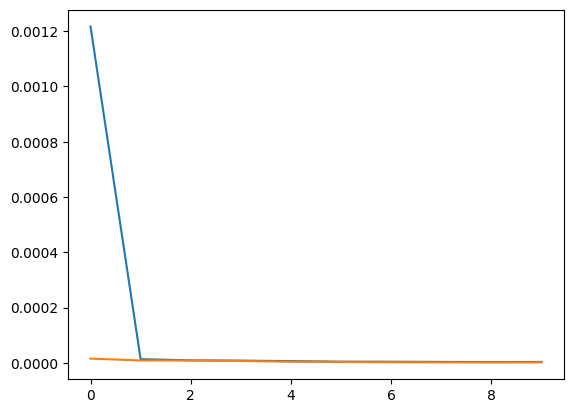

In [ ]:
X = np.load(drive_path + "/X_sequences.npy")  # (9144129, 50, 2)
y = np.load(drive_path + "/y_targets.npy")    # (9144129, 2)

#Setting seed for reproducability
np.random.seed(42)

#Sample 200,000 Data Points Randomly (Preserving Shape). Our previous dataset was far too large for the resources we are using.
sample_size = 200000
indices = np.random.permutation(len(X))[:sample_size]  # Randomized indices
X_sampled = X[indices]  # (200000, 50, 2)
y_sampled = y[indices]  # (200000, 2)
sampled_indices = seq_indices[indices]  # Retrieve original indices

#Train-Test Split (80-20)
# 🔹 Train-Test Split (80-20)
X_train, X_test, y_train, y_test, X_train_indices, X_test_indices = train_test_split(X_sampled, y_sampled, sampled_indices, test_size=0.2, random_state=42)

#Verify Correct Shapes Before Saving
print("Final X_train shape:", X_train.shape)  # Expected: (160000, 50, 2)
print("Final X_test shape:", X_test.shape)    # Expected: (40000, 50, 2)
print("Final y_train shape:", y_train.shape)  # Expected: (160000, 2)
print("Final y_test shape:", y_test.shape)    # Expected: (40000, 2)

#Save Processed Test Data
np.save(drive_path + "/X_test.npy", X_test)
np.save(drive_path + "/y_test.npy", y_test)

#Build LSTM Model
model = Sequential([
    LSTM(128, return_sequences=True, input_shape=(50, 2)),
    Dropout(0.2),
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    Dense(2)  # Predict latitude & longitude
])

#Compile Model
model.compile(optimizer='adam', loss='mse', metrics=['mae'])

#Train Model
history = model.fit(X_train, y_train, epochs=10, batch_size=128, validation_data=(X_test, y_test))

#Save Model Correctly
model.save(drive_path + "/lstm_next_location.h5")

#Evaluate Model
test_loss, test_mae = model.evaluate(X_test, y_test)
print("Test Loss (MSE):", test_loss)
print("Test MAE:", test_mae)

#Plot Training & Validation Loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')


Checking the LSTM for performance through the actual versus predicted graphic. We see good approximation from the model.

1250/1250 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step


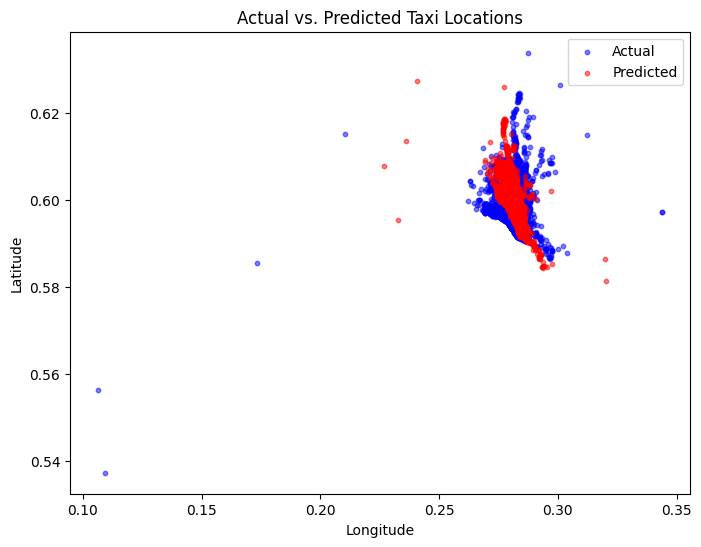

In [ ]:
#Define the custom loss function explicitly
custom_objects = {"mse": tf.keras.losses.MeanSquaredError()}

#Load the model with custom objects
model = tf.keras.models.load_model("/content/drive/My Drive/lstm_next_location.h5", custom_objects=custom_objects)

#Load Processed Test Data
X_test = np.load(drive_path + "/X_test.npy")
y_test = np.load(drive_path + "/y_test.npy")

#Make Predictions
y_pred = model.predict(X_test)

#Extract Latitude & Longitude
true_lats, true_longs = y_test[:, 0], y_test[:, 1]
pred_lats, pred_longs = y_pred[:, 0], y_pred[:, 1]

#Plot Actual vs. Predicted Taxi Locations
plt.figure(figsize=(8, 6))
plt.scatter(true_longs, true_lats, color='blue', alpha=0.5, label="Actual", s=10)
plt.scatter(pred_longs, pred_lats, color='red', alpha=0.5, label="Predicted", s=10)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Actual vs. Predicted Taxi Locations")
plt.legend()
plt.show()


Looking at errors with a bar chart.

1250/1250 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step


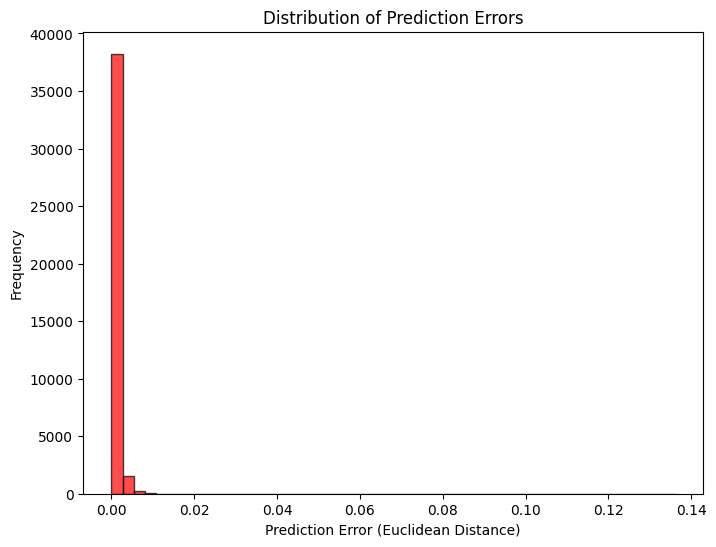

Mean Error: 0.00132
Median Error: 0.00117
Max Error: 0.13608
Min Error: 0.00000


In [ ]:
#Load Test Data
X_test = np.load(drive_path + "/X_test.npy")
y_test = np.load(drive_path + "/y_test.npy")

#Generate Predictions
y_pred = model.predict(X_test)

#Save Predictions to Avoid Recomputing
np.save(drive_path + "/y_pred.npy", y_pred)

#Compute Errors (Euclidean Distance)
errors = np.sqrt((y_test[:, 0] - y_pred[:, 0])**2 + (y_test[:, 1] - y_pred[:, 1])**2)

#Plot Error Distribution
plt.figure(figsize=(8, 6))
plt.hist(errors, bins=50, alpha=0.7, color='red', edgecolor='black')
plt.xlabel("Prediction Error (Euclidean Distance)")
plt.ylabel("Frequency")
plt.title("Distribution of Prediction Errors")
plt.show()

#Print Basic Error Stats
print(f"Mean Error: {np.mean(errors):.5f}")
print(f"Median Error: {np.median(errors):.5f}")
print(f"Max Error: {np.max(errors):.5f}")
print(f"Min Error: {np.min(errors):.5f}")


Checking errors by quadrant.

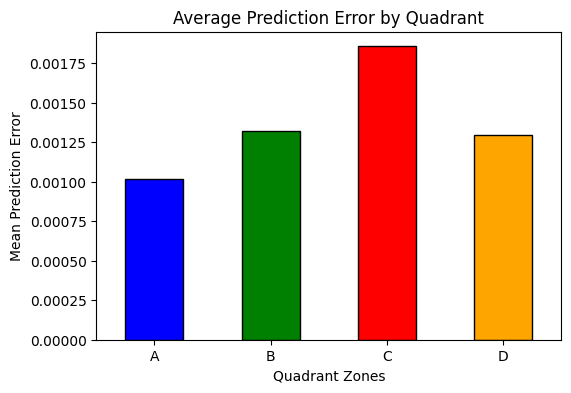

In [ ]:
#Load test data and predictions
y_test = np.load(drive_path + "/y_test.npy")
y_pred = np.load(drive_path + "/y_pred.npy")

#Define Porto city quadrants based on lat/lon ranges
mid_lat = np.median(y_test[:, 0])  # Median latitude
mid_lon = np.median(y_test[:, 1])  # Median longitude

#Compute errors (Euclidean distance between actual and predicted points)
errors = np.sqrt((y_test[:, 0] - y_pred[:, 0])**2 + (y_test[:, 1] - y_pred[:, 1])**2)

#Assign Quadrants: A (Upper Left), B (Upper Right), C (Lower Left), D (Lower Right)
zones = []
for lat, lon in zip(y_test[:, 0], y_test[:, 1]):
    if lat >= mid_lat and lon < mid_lon:
        zones.append("A")
    elif lat >= mid_lat and lon >= mid_lon:
        zones.append("B")
    elif lat < mid_lat and lon < mid_lon:
        zones.append("C")
    else:
        zones.append("D")

#Convert to DataFrame for analysis
df = pd.DataFrame({"Latitude": y_test[:, 0], "Longitude": y_test[:, 1], "Error": errors, "Zone": zones})

#Aggregate mean error per quadrant
zone_errors = df.groupby("Zone")["Error"].mean().reindex(["A", "B", "C", "D"])

#Plot error heatmap per quadrant
plt.figure(figsize=(6, 4))
zone_errors.plot(kind="bar", color=["blue", "green", "red", "orange"], edgecolor="black")
plt.xlabel("Quadrant Zones")
plt.ylabel("Mean Prediction Error")
plt.title("Average Prediction Error by Quadrant")
plt.xticks(rotation=0)
plt.show()


In [ ]:
# load the kmeans model
kmeans = joblib.load(drive_path + "zone.pkl")

def find_zone(latitude, longitude, kmeans):
    """Returns the zone for a given latitude and longitude."""
    coords = np.array([[latitude, longitude]])
    zone = kmeans.predict(coords)[0]  # Predict the zone
    return zone

In [ ]:
# save the actual preducted values in csv along along with orignal taxi id and timestamps in df
# Load Original Indices
original_indices = np.load(drive_path + "/seq_indices.npy")

# Get the relevant columns (taxi_id and timestamp) from the original DataFrame using original indices
taxi_ids = df.loc[X_test_indices , 'TAXI_ID'].values
timestamps = df.loc[X_test_indices , 'TIMESTAMP'].values

y_test_unscaled = scaler.inverse_transform(y_test)
y_pred_unscaled = scaler.inverse_transform(y_pred)


print(taxi_ids.shape,timestamps.shape, y_test.shape, y_pred.shape)
# Create a new DataFrame
results_df = pd.DataFrame({
    'taxi_id': taxi_ids,
    'timestamp': timestamps,
    'actual_x': y_test_unscaled[:, 0],  # Assuming y_test is [x, y] coordinates
    'actual_y': y_test_unscaled[:, 1],
    'predicted_x': y_pred_unscaled[:, 0],  # Predicted x coordinate
    'predicted_y': y_pred_unscaled[:, 1]   # Predicted y coordinate
})

results_df['actual_zone'] = results_df.apply(lambda x: 'zone ' + str(find_zone(x['actual_x'], x['actual_y'], kmeans) + 1), axis=1)
results_df['predicted_zone'] = results_df.apply(lambda x: 'zone ' + str(find_zone(x['predicted_x'], x['predicted_y'], kmeans) + 1), axis=1)

# Display the results
print(results_df.head())

results_df.to_csv(drive_path + "/next_location_results.csv", index=False)


(40000,) (40000,) (40000, 2) (40000, 2)


/Users/bosky/boskymsaiicoursework/src/module2-assginment/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
/Users/bosky/boskymsaiicoursework/src/module2-assginment/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
/Users/bosky/boskymsaiicoursework/src/module2-assginment/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
/Users/bosky/boskymsaiicoursework/src/module2-assginment/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(
/Users/bosky/boskymsaiicoursework/src/module2-assginment/lib/python3.12/site-packages/sk

    taxi_id           timestamp  actual_x   actual_y  predicted_x  \
0  20000235 2014-01-26 03:25:04 -8.622882  41.169258    -8.673358   
1  20000013 2014-03-22 20:00:25 -8.644995  41.150448    -8.680100   
2  20000507 2013-08-25 15:06:28 -8.587512  41.149269    -8.640457   
3  20000312 2013-09-06 08:28:01 -8.648604  41.172471    -8.685811   
4  20000031 2014-03-15 07:40:50 -8.660538  41.194287    -8.693919   

   predicted_y actual_zone predicted_zone  
0    41.170029      zone 5         zone 2  
1    41.156124      zone 5         zone 2  
2    41.147942      zone 3         zone 5  
3    41.168564      zone 5         zone 2  
4    41.199215      zone 2         zone 2  
